# Imports

In [2]:
%reload_ext autoreload
%autoreload 2

In [8]:
import math, itertools, traceback
from ncempy.io import dm

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import Normalize
from matplotlib import cm

from mpl_toolkits import mplot3d
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.interpolate import UnivariateSpline
from scipy.fft import rfft2, rfftfreq

from pynistview_utils import *
from selelems import *
# import pynistview_utils as pyn
# import selelems as sel

import cv2

# plt.style.use('dark_background')


# Set up directories and files

In [4]:
# Configure input files

indir = "/Users/rmoraski/Documents/iCloud/School/Electrons/NISTView-ish/data"
sempa_file_suffix = 'sempa'

#name = "191001_Fe_whisker/Fe_whisker"

# name = "FeGd_Nov_Dec/171117_FeGd"
# runs = (2, 3)
name = "FeGd_Nov_Dec/FeGd100"
runs = (6, 7)
# runs = (11, 10)
# name = "FeGd_Nov_Dec/FeGd200"
# runs = (3, 2) # bad
# runs = (5, 6) # also bad
# name = 'alice/171117_FeGd'
# runs = (2, 3)

# Specify the number of features - 1 in the image. This is used to segment and create masks.
segments = 2

# Specify gaussian denoising sigma
sigma = 2

# Specify non-local denoising strength h. Larger h -> more denoising.
h = 20

# Specify a scale for drawing the vector arrows. Smaller number -> longer arrow.
arrow_scale = 0.2

# Specify a color for the vector arrows.
# arrow_color = 'black'
arrow_color = 'white'

# Import files

In [5]:
image_dict = import_files(name, runs, indir)

intensity_1, intensity_1_blurred, intensity_1_flat = image_dict['i1']
intensity_2, intensity_2_blurred, intensity_2_flat = image_dict['i2']

m_1, axis_1, m_1_ydim, m_1_xdim, m_1_min, m_1_max = image_dict['m1']
m_2, axis_2, m_2_ydim, m_2_xdim, m_2_min, m_2_max = image_dict['m2']
m_3, axis_3, m_3_ydim, m_3_xdim, m_3_min, m_3_max = image_dict['m3']
m_4, axis_4, m_4_ydim, m_4_xdim, m_4_min, m_4_max = image_dict['m4']

scale = image_dict['scale']
magnification = image_dict['magnification']

Searching FeGd_Nov_Dec/FeGd100* for runs (6, 7)...
Found files:
['FeGd100006_ix.sempa', 'FeGd100006_iy.sempa', 'FeGd100006_mx.sempa', 'FeGd100006_my.sempa', 'FeGd100007_ix2.sempa', 'FeGd100007_iz.sempa', 'FeGd100007_mx2.sempa', 'FeGd100007_mz.sempa']


FeGd_Nov_Dec/FeGd100 (6, 7)
Scale: 9.05 nm per pixel, Magnification: 60000x


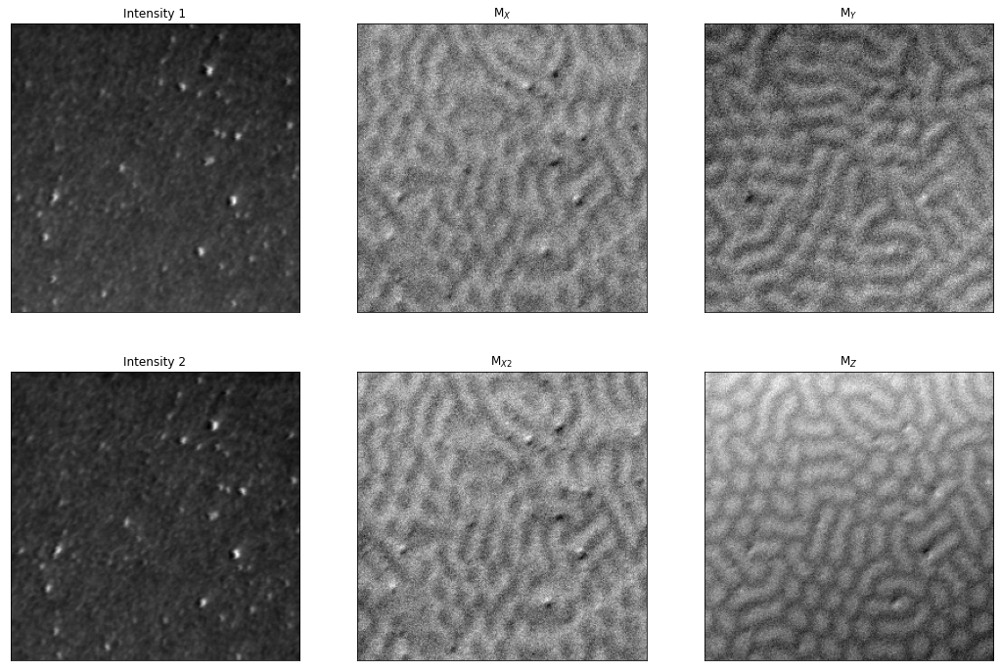

In [6]:
fig = plt.figure(figsize=(18, 12));
plt.subplot(231);
plt.imshow(intensity_1, cmap='gray');
plt.title('Intensity 1');
plt.subplot(232);
plt.imshow(m_1, cmap='gray');
plt.title(fr'M$_{axis_1}$');
plt.subplot(233);
plt.imshow(m_2, cmap='gray');
plt.title(f'M$_{axis_2}$');
plt.subplot(234);
plt.imshow(intensity_2, cmap='gray');
plt.title('Intensity 2');
plt.subplot(235);
plt.imshow(m_4, cmap='gray');
plt.title(f'M$_{axis_4}$$_2$');
plt.subplot(236);
plt.imshow(m_3, cmap='gray');
plt.title(f'M$_{axis_3}$');

for ax in fig.get_axes():
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)

print(name, runs)
print(f'Scale: {scale * 10e8:.2f} nm per pixel, Magnification: {int(magnification)}x')

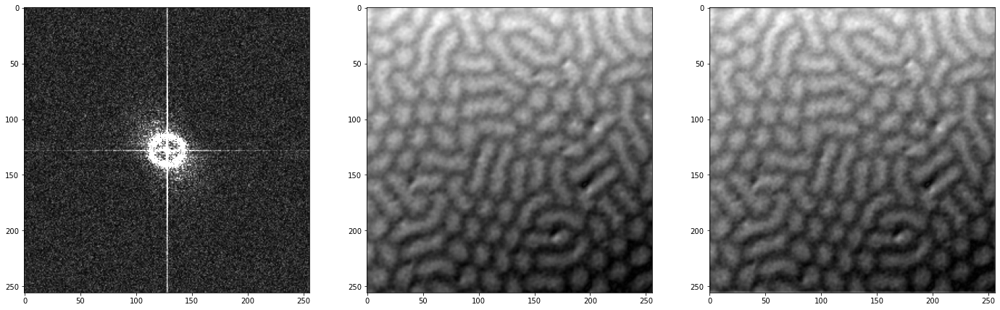

In [78]:
m_3_fft = np.fft.fft2(m_3)
m_3_fft = np.fft.fftshift(m_3_fft)

nrows, ncols = m_3_fft.shape
sigma = nrows / 4

c_y, c_x = nrows / 2, ncols / 2
x, y = np.linspace(0, nrows, nrows), np.linspace(0, ncols, ncols)
X, Y = np.meshgrid(x, y)
gaussian_mask_grad = np.exp(-(((X - c_x))**2 + ((Y - c_y))**2))
gaussian_mask_grad /= gaussian_mask_grad.max()
gaussian_mask_clean = np.exp(-(((X - c_x)/sigma)**2 + ((Y - c_y)/sigma)**2))
m_3_fft_g = m_3_fft * gaussian_mask_clean
m_3_ifft = np.fft.ifft2(m_3_fft_g)

fig, axs = plt.subplots(1, 3);
fig.set_size_inches(24, 8);

axs[0].imshow(np.abs(m_3_fft), cmap='gray', vmax=20);
# axs[1].hist(np.abs(m_3_fft), bins=32);
axs[1].imshow(np.abs(gaussian_filter(m_3, 1)), cmap='gray')
axs[2].imshow(np.abs(m_3_ifft), cmap='gray');

-2.4445931799897577e-05

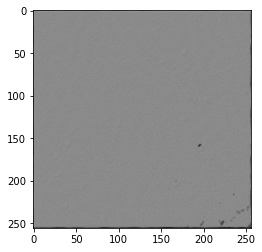

In [80]:
plt.imshow(gaussian_filter(m_3, 1) - np.abs(m_3_ifft), cmap = 'gray');

(gaussian_filter(m_3, 1) - np.abs(m_3_ifft)).mean()

In [72]:
m_3_min, m_3_max, np.abs(m_3_fft_g).min(), np.abs(
    m_3_fft_g).max(), np.abs(m_3_ifft).min(), np.abs(m_3_ifft).max()


(-0.057347316,
 0.21853292,
 0.00010572523082482759,
 5343.30970869199,
 2.0334969367869414e-05,
 0.19197504309807992)

# Align scans

Get the 2 ix images aligned as best possible

In [6]:
sigma = 2

try:
    results_r, results_h, h, imMatches, imKeypoints = align_and_scale(intensity_1, intensity_2, m_1, m_2, m_3, m_4)
    intensity_1_r, intensity_2_r, m_1_r, m_2_r, m_3_r, m_4_r = results_r
    intensity_1_h, m_1_h, m_2_h = results_h

    intensity_2_scaled_to_1 = rescale_to(intensity_2_r, intensity_1_r)
    m_4_scaled_to_1 = rescale_to(m_4_r, m_1_r)
    difference_im = intensity_2_scaled_to_1 - intensity_1_r
    difference_mx = m_4_scaled_to_1 - m_1_r

    m_1_r_g_full = rescale_to(gaussian_filter(m_1_r, sigma), m_1_r)
    m_2_r_g_full = rescale_to(gaussian_filter(m_2_r, sigma), m_2_r)
    m_3_r_g_full = rescale_to(gaussian_filter(m_3_r, sigma), m_3_r)
    m_4_r_g_full = rescale_to(gaussian_filter(m_4_r, sigma), m_4_r)
except Exception as ex:
    print()
    print(ex)
    print()
    traceback.print_exc()


Found 126 matches; keeping 18.
Found image center: (46.0, 104.7)


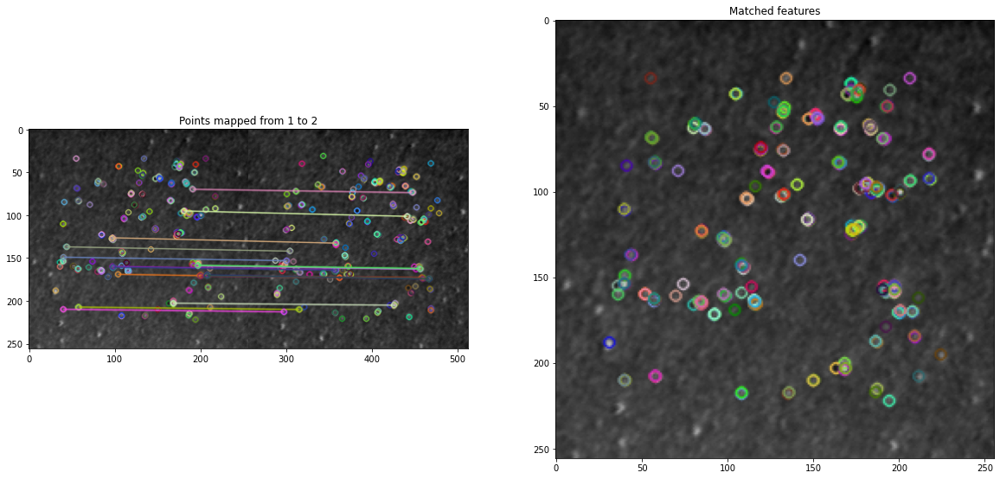

In [7]:
fig = plt.figure(figsize=(20, 10));
fig.add_subplot(121);
plt.imshow(imMatches);
plt.title('Points mapped from 1 to 2');

fig.add_subplot(122);
plt.imshow(imKeypoints);
plt.title('Matched features');

Cropped to 244 x 237


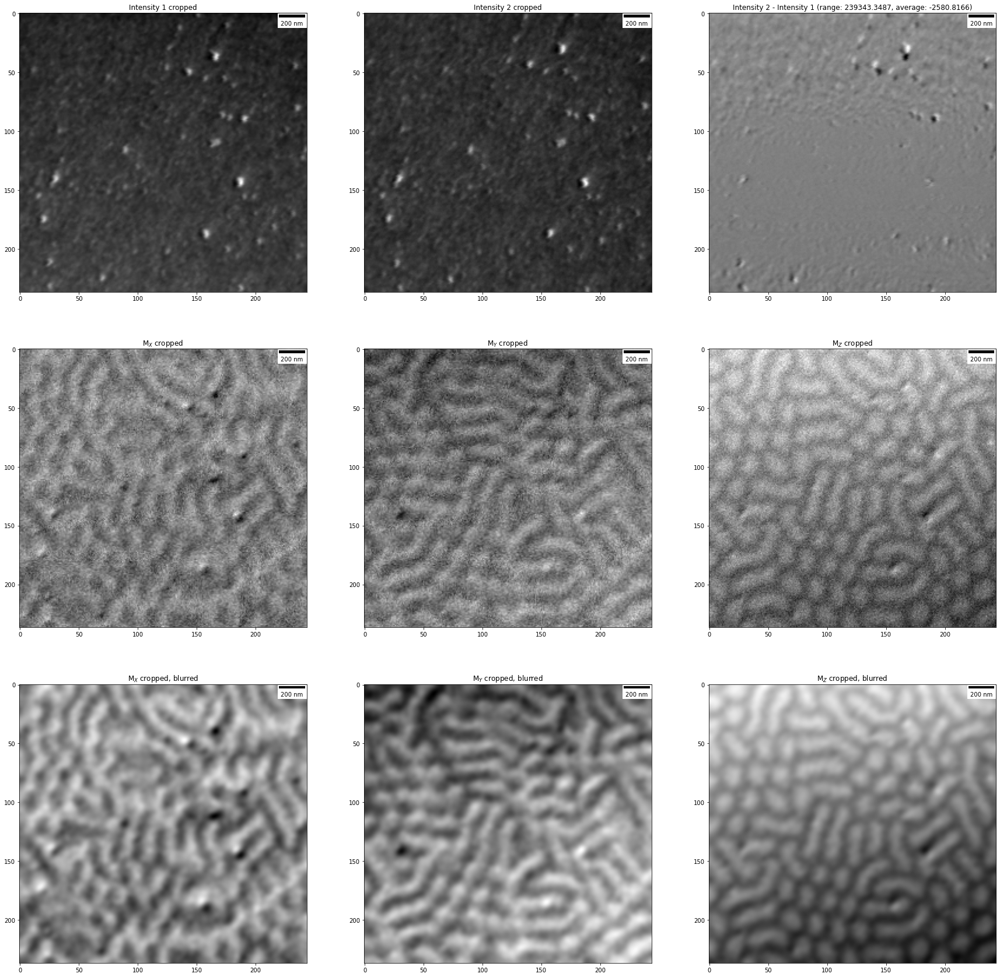

In [8]:
fig = plt.figure(figsize=(30, 30));

ax1 = fig.add_subplot(3, 3, 1);
ax1.imshow(intensity_1_r, cmap='gray');
ax1.set_title('Intensity 1 cropped')

ax2 = fig.add_subplot(3, 3, 2);
ax2.imshow(intensity_2_r, cmap='gray');
ax2.set_title('Intensity 2 cropped')

ax3 = fig.add_subplot(3, 3, 3);
ax3.imshow(difference_im, cmap='gray');
ax3.set_title(f'Intensity 2 - Intensity 1 (range: {np.ptp(difference_im):.4f}, average: {np.average(difference_im):.4f})');


ax4 = fig.add_subplot(3, 3, 4);
ax4.imshow(m_1_r, cmap='gray');
ax4.set_title(fr'M$_{axis_1}$ cropped');

ax5 = fig.add_subplot(3, 3, 5);
ax5.imshow(m_2_r, cmap='gray');
ax5.set_title(fr'M$_{axis_2}$ cropped');

ax6 = fig.add_subplot(3, 3, 6);
ax6.imshow(m_3_r, cmap='gray');
ax6.set_title(fr'M$_{axis_3}$ cropped');

ax7 = fig.add_subplot(3, 3, 7);
ax7.imshow(m_1_r_g_full, cmap='gray')
ax7.set_title(fr'M$_{axis_1}$ cropped, blurred');

ax8 = fig.add_subplot(3, 3, 8);
ax8.imshow(m_2_r_g_full, cmap='gray')
ax8.set_title(fr'M$_{axis_2}$ cropped, blurred');

ax9 = fig.add_subplot(3, 3, 9);
ax9.imshow(m_3_r_g_full, cmap='gray')
ax9.set_title(fr'M$_{axis_3}$ cropped, blurred');


for ax in fig.get_axes():
    ax.add_artist(ScaleBar(scale));
    
print(f'Cropped to {intensity_1_r.shape[1]} x {intensity_1_r.shape[0]}')


# Find offsets

The imaging components do not use the same zero point. Since the magnetization vector should have the same magnitude over the entire sample, minimize the min to max spread across the combined images.

In [9]:
# Eliminate outliers
m_1_r_g, m_2_r_g, m_3_r_g = limit_to(m_1_r_g_full), limit_to(
    m_2_r_g_full), limit_to(m_3_r_g_full)

# Find averages for each image and shift the values
m_1_average, m_2_average, m_3_average = np.average(m_1_r_g), \
    np.average(m_2_r_g), np.average(m_3_r_g)

m_1_shifted, m_2_shifted, m_3_shifted = m_1_r_g - m_1_average, \
    m_2_r_g - m_2_average, m_3_r_g - m_3_average

# Optimize the amount of shift necessary by minimizing least squares fitting
(m_1_offset, m_2_offset, m_3_offset), status, message = \
    find_offsets(m_1_shifted, m_2_shifted, m_3_shifted)

m_1_offset_opt, m_2_offset_opt, m_3_offset_opt = \
    m_1_average + m_1_offset, m_2_average + m_2_offset, m_3_average + m_3_offset

m_1_adjusted, m_2_adjusted, m_3_adjusted = \
    m_1_r_g - m_1_offset_opt, m_2_r_g - m_2_offset_opt, m_3_r_g - m_3_offset_opt

m_1_adjusted = m_1_adjusted - fit_image(m_1_adjusted)[0]
m_2_adjusted = m_2_adjusted - fit_image(m_2_adjusted)[0]
m_3_adjusted = m_3_adjusted - fit_image(m_3_adjusted)[0]

# (m_1_offset, m_2_offset, m_3_offset), status, message = find_offsets(m_1_r, m_2_r, m_3_r)
# m_1_adjusted, m_2_adjusted, m_3_adjusted = m_1_r - m_1_offset, m_2_r - m_2_offset, m_3_r - m_3_offset

print('M{} average: {:.4f}, M{} average: {:.4f}, M{} average: {:.4f}'.format(
    axis_1, m_1_average, axis_2, m_2_average, axis_3, m_3_average))
print('M{} offset: {:.4f}, M{} offset: {:.4f}, M{} offset: {:.4f}'.format(
    axis_1, m_1_offset, axis_2, m_2_offset, axis_3, m_3_offset))

print('M{} original range: {:.4f} to {:.4f}; offset range: {:.3f}, {:.4f} to {:.4f}'.format(
    axis_1, m_1_min, m_1_max, np.ptp(m_1_adjusted), m_1_adjusted.min(), m_1_adjusted.max()))
print('M{} original range: {:.4f} to {:.4f}; offset range: {:.3f}, {:.4f} to {:.4f}'.format(
    axis_2, m_2_min, m_2_max, np.ptp(m_2_adjusted), m_2_adjusted.min(), m_2_adjusted.max()))
print('M{} original range: {:.4f} to {:.4f}; offset range: {:.3f}, {:.4f} to {:.4f}'.format(
    axis_3, m_3_min, m_3_max, np.ptp(m_3_adjusted), m_3_adjusted.min(), m_3_adjusted.max()))

`ftol` termination condition is satisfied.
Function evaluations 5, initial cost 1.0570e-02, final cost 1.0570e-02, first-order optimality 7.84e-02.
MX average: 1.2639, MY average: -0.5073, MZ average: 0.0663
MX offset: -0.0000, MY offset: -0.0000, MZ offset: 0.0000
MX original range: 1.1648 to 1.3357; offset range: 0.139, -0.0676 to 0.0712
MY original range: -0.5950 to -0.4314; offset range: 0.134, -0.0731 to 0.0606
MZ original range: -0.0573 to 0.2185; offset range: 0.144, -0.0720 to 0.0723


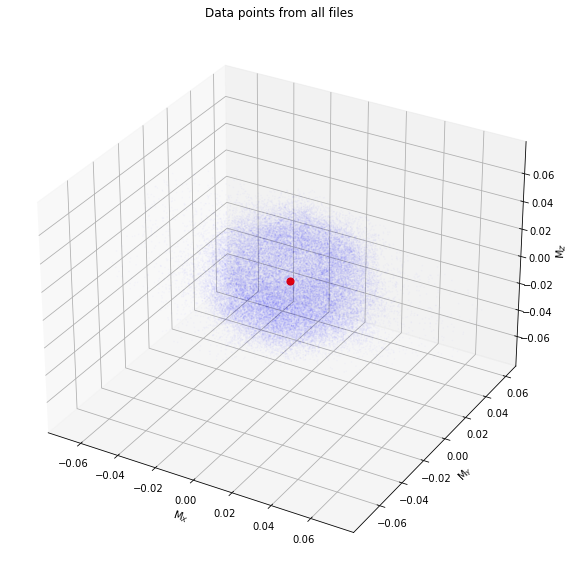

In [10]:
fig = plt.figure(figsize=(10, 10));
ax1 = fig.add_subplot(111, projection='3d');

ax1.scatter3D(m_1_adjusted.flatten(), m_2_adjusted.flatten(), m_3_adjusted.flatten(), s=1, c='blue', alpha=0.01);
ax1.scatter3D(0, 0, 0, s=50, c='red');
ax1.set_xlabel(fr'M$_{axis_1}$');
ax1.set_ylabel(fr'M$_{axis_2}$');
ax1.set_zlabel(fr'M$_{axis_3}$');
plt.title('Data points from all files');

# Calculate magnitudes and angles, find contours

In [11]:
# Calculate magnitudes and angles
magnitudes = get_magnitudes(m_1_adjusted, m_2_adjusted, m_3_adjusted)
magnitudes /= magnitudes.max()
max_dev = np.std(magnitudes)
# upper_limit = magnitudes.mean() + 3 * max_dev
# magnitudes = np.where(magnitudes < upper_limit, magnitudes, upper_limit)

phis, thetas = get_phases(m_1_adjusted, m_2_adjusted, m_3_adjusted)
phis_rgba = render_phases_and_magnitudes(phis, magnitudes)

# Apply a light gaussian filter to clean up the images
magnitudes_flattened = rescale_to(gaussian_filter(magnitudes, 2), [0, 1])
phis_flattened = rescale_to(gaussian_filter(phis, 3), phis)
thetas_flattened = rescale_to(gaussian_filter(thetas, 3), thetas)
phis_flattened_rgba = render_phases_and_magnitudes(
    phis_flattened, magnitudes_flattened)

# Find circular features in the Z direction
circular_contours, contours_g, contours = find_circular_contours(
    thetas_flattened)

mag_low, mag_high = np.percentile(
    magnitudes_flattened, 5), np.percentile(magnitudes_flattened, 95)

# Calculate 2D values as well
magnitudes_2d = get_magnitudes(m_1_adjusted, m_2_adjusted)
magnitudes_2d /= magnitudes_2d.max()
max_dev = np.std(magnitudes_2d)
upper_limit = magnitudes_2d.mean() + 3 * max_dev
magnitudes_2d_trimmed = np.where(
    magnitudes_2d < upper_limit, magnitudes_2d, upper_limit)
magnitudes_2d_flattened = rescale_to(
    gaussian_filter(magnitudes_2d_trimmed, 3), [0, 1])

phis_2d, _ = get_phases(m_1_adjusted, m_2_adjusted)

print('Magnitudes range from {:.4f} to {:.4f} with mean {:.4f}, stddev {:.4f}, and 90% confidence interval {:.4f}..{:.4f}'.format(
    magnitudes_flattened.min(), magnitudes_flattened.max(), magnitudes_flattened.mean(), max_dev, mag_low, mag_high))
print(f'\N{greek small letter phi} ranges from {phis_flattened.min():.4f} to {phis_flattened.max():.4f}')
print(f'\N{greek small letter theta} ranges from {thetas_flattened.min():.4f} to {thetas_flattened.max():.4f}')
print(
    f'Found {len(circular_contours)} circular contours out of {len(contours)} total.')


Magnitudes range from 0.0000 to 1.0000 with mean 0.2798, stddev 0.1166, and 90% confidence interval 0.1319..0.4411
φ ranges from 0.0001 to 6.2831
θ ranges from 0.0117 to 3.1315
Found 30 circular contours out of 68 total.


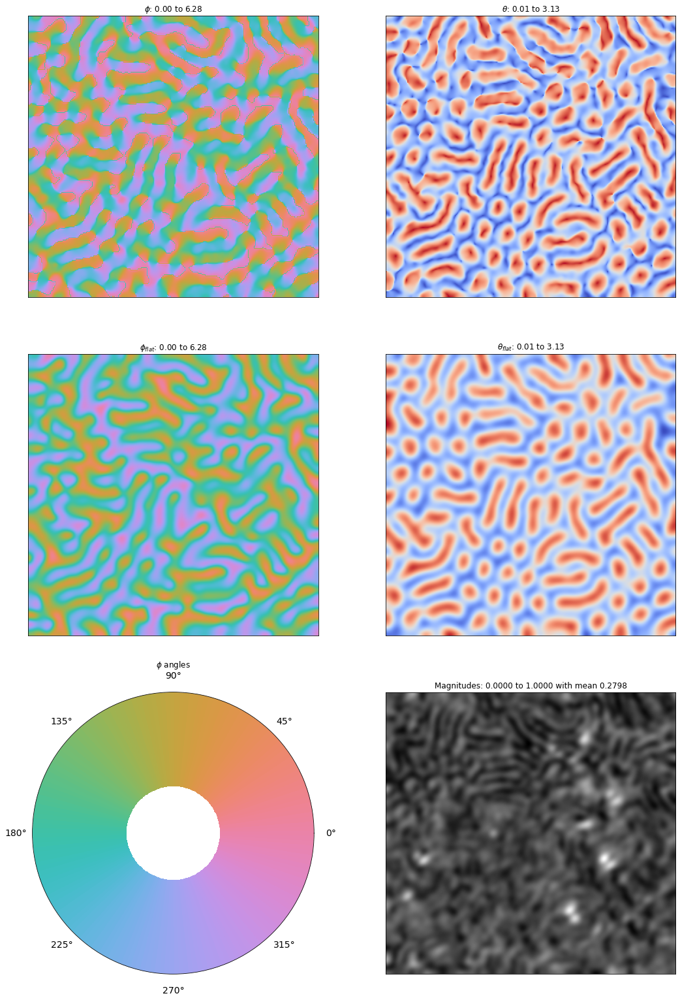

In [12]:
plt.figure(figsize=(18, 27));

ax1 = plt.subplot(3, 2, 1);
ax1.imshow(phis, cmap=ciecam02_cmap());
ax1.set_title(rf'$\phi$: {phis.min():.2f} to {phis.max():.2f}');
ax1.axes.get_xaxis().set_visible(False)
ax1.axes.get_yaxis().set_visible(False)

ax2 = plt.subplot(3, 2, 2);
ax2.imshow(thetas, cmap=cm.coolwarm_r);
ax2.set_title(rf'$\theta$: {thetas.min():.2f} to {thetas.max():.2f}');
ax2.axes.get_xaxis().set_visible(False)
ax2.axes.get_yaxis().set_visible(False)

ax3 = plt.subplot(3, 2, 3);
ax3.imshow(phis_flattened, cmap=ciecam02_cmap());
ax3.set_title(rf'$\phi_{{flat}}$: {phis_flattened.min():.2f} to {phis_flattened.max():.2f}');
ax3.axes.get_xaxis().set_visible(False)
ax3.axes.get_yaxis().set_visible(False)

ax4 = plt.subplot(3, 2, 4);
ax4.imshow(thetas_flattened, cmap=cm.coolwarm_r);
ax4.set_title(rf'$\theta_{{flat}}$: {thetas_flattened.min():.2f} to {thetas_flattened.max():.2f}');
ax4.axes.get_xaxis().set_visible(False)
ax4.axes.get_yaxis().set_visible(False)

ax5 = plt.subplot(3, 2, 5, polar=True)
show_phase_colors_circle(ax5, add_dark_background=False)
ax5.set_title(r'$\phi$ angles');

ax6 = plt.subplot(3, 2, 6);
ax6.imshow(magnitudes_flattened, cmap='gray');
ax6.set_title(f'Magnitudes: {magnitudes_flattened.min():.4f} to '
              f'{magnitudes_flattened.max():.4f} with mean {magnitudes_flattened.mean():.4f}');
ax6.axes.get_xaxis().set_visible(False)
ax6.axes.get_yaxis().set_visible(False)


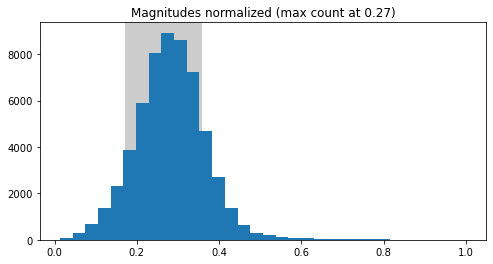

In [13]:
bins = 32

plt.figure(figsize=(8, 4));
n, b, _ = plt.hist(magnitudes.flatten(), bins=bins, zorder=10);
max_count = max(n)
avg = (1 + 2 * np.squeeze(np.where(n == max_count))[()]) / (2 * bins)
spline = UnivariateSpline(np.linspace(0, 1, bins), n - max_count / 2, s=0)
# plt.vlines(mag_low, 0, max_count, color='gray');
# plt.vlines(mag_high, 0, max_count, color='gray')
plt.axvspan(*spline.roots(), facecolor='gray', alpha=0.4, zorder=0);
plt.title(f'Magnitudes normalized (max count at {avg:.2f})');


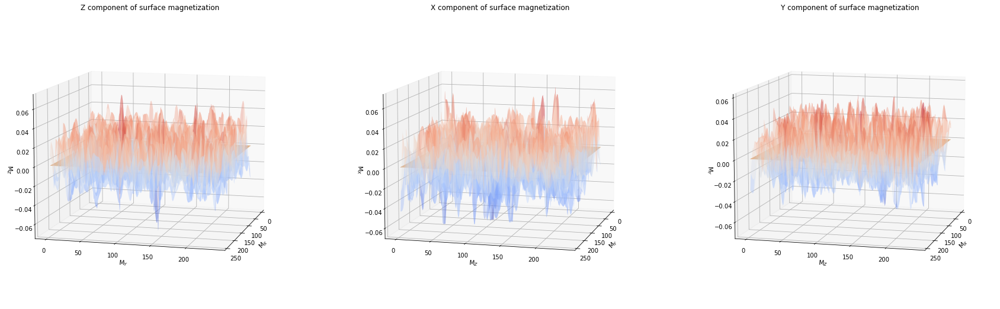

In [14]:
# %matplotlib widget

azim, elev = 15, 10;

xs, ys = np.linspace(1, magnitudes.shape[1], magnitudes.shape[1]), np.linspace(1, magnitudes.shape[0], magnitudes.shape[0])
Xs, Ys = np.meshgrid(xs, ys)

zs = m_3_adjusted # magnitudes * np.cos(thetas_flattened)

fig = plt.figure(figsize=(30, 11));
ax1 = fig.add_subplot(1, 3, 1, projection='3d');
ax1.azim = azim;
ax1.elev = elev;
# ax.contour3D(Xs, Ys, zs, 100, cmap=cm.coolwarm, alpha=0.5);
surface = ax1.plot_surface(Xs, Ys, zs, cmap=cm.coolwarm, linewidth=0, alpha=0.3);
ax1.plot_surface(Xs, Ys, np.zeros_like(Xs), alpha=0.5)
# ax.plot_wireframe(Xs, Ys, zs, cmap=cm.coolwarm);

ax1.set_xlabel(fr'M$_{axis_1}$');
ax1.set_ylabel(fr'M$_{axis_2}$');
ax1.set_zlabel(fr'M$_{axis_3}$');
plt.title(f'{axis_3} component of surface magnetization');

ax2 = fig.add_subplot(1, 3, 2, projection='3d');
ax2.azim = azim;
ax2.elev = elev;
# ax.contour3D(Xs, Ys, zs, 100, cmap=cm.coolwarm, alpha=0.5);
surface = ax2.plot_surface(Xs, Ys, m_1_adjusted, cmap=cm.coolwarm, linewidth=0, alpha=0.3);
ax2.plot_surface(Xs, Ys, np.zeros_like(Xs), alpha=0.5)
# ax.plot_wireframe(Xs, Ys, zs, cmap=cm.coolwarm);

ax2.set_xlabel(fr'M$_{axis_2}$');
ax2.set_ylabel(fr'M$_{axis_3}$');
ax2.set_zlabel(fr'M$_{axis_1}$');
plt.title(f'{axis_1} component of surface magnetization');

ax3 = fig.add_subplot(1, 3, 3, projection='3d');
ax3.azim = azim;
ax3.elev = elev;
# ax.contour3D(Xs, Ys, zs, 100, cmap=cm.coolwarm, alpha=0.5);
surface = ax3.plot_surface(Xs, Ys, m_2_adjusted, cmap=cm.coolwarm, linewidth=0, alpha=0.3);
ax3.plot_surface(Xs, Ys, np.zeros_like(Xs), alpha=0.5)
# ax.plot_wireframe(Xs, Ys, zs, cmap=cm.coolwarm);

ax3.set_xlabel(fr'M$_{axis_1}$');
ax3.set_ylabel(fr'M$_{axis_3}$');
ax3.set_zlabel(fr'M$_{axis_2}$');
plt.title(f'{axis_2} component of surface magnetization');

In [132]:
# Get dimensions. divisor is the step between samples for vector arrows.
yd, xd = magnitudes.shape
divisor = 6
sigma = 3

# Get an even number of samples in both directions
samples_x_half, samples_y_half =  math.ceil(xd // divisor), math.ceil(yd // divisor)
samples_x, samples_y = samples_x_half * 2, samples_y_half * 2

# Build a convolution kernel with odd dimensions
kernel_tweak_x, kernel_tweak_y = samples_x_half % 2 - 1, samples_y_half % 2 - 1
kernel = np.ones((samples_y // 2 - kernel_tweak_y, samples_x // 2 - kernel_tweak_x))
kernel = np.ones((3, 3))

x = np.linspace(xd / samples_x, xd * (samples_x - 1) / samples_x, samples_x, dtype=np.uint8)
y = np.linspace(yd / samples_y, yd * (samples_y - 1) / samples_y, samples_y, dtype=np.uint8)

# Create a pair of (x, y) coordinates
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)

U = magnitudes_flattened * np.cos(phis) * np.sin(thetas_flattened)
V = magnitudes_flattened * np.sin(phis) * np.sin(thetas_flattened)
W = magnitudes_flattened * np.cos(thetas_flattened)

xs, ys, zs = X.ravel(), Y.ravel(), Z.ravel()

# Pull the values at those coordinates.
# Us_g = convolve2d(Us, kernel, mode='same')[y, x].reshape(U.shape)
# Vs_g = convolve2d(Vs, kernel, mode='same')[y, x].reshape(V.shape)
# Ws_g = convolve2d(Ws, kernel, mode='same')[y, x].reshape(W.shape)
U_g = gaussian_filter(U, sigma)[ys, xs].reshape(X.shape)
V_g = gaussian_filter(V, sigma)[ys, xs].reshape(Y.shape)
W_g = gaussian_filter(W, sigma)[ys, xs].reshape(Z.shape)

print('M{}   min/max: ({:.3f}, {:.3f}), M{}   min/max: ({:.3f}, {:.3f}), M{}   min/max: ({:.3f}, {:.3f})'.format(
    axis_1, m_1_adjusted.min(), m_1_adjusted.max(), axis_2, m_2_adjusted.min(), m_2_adjusted.max(),
    axis_3, m_3_adjusted.min(), m_3_adjusted.max()));
print('U    min/max: ({:.3f}, {:.3f}), V    min/max: ({:.3f}, {:.3f}), W    min/max: ({:.3f}, {:.3f})'.format(
    U.min(), U.max(), V.min(), V.max(), W.min(), W.max()));
print('U_g  min/max: ({:.3f}, {:.3f}), V_g  min/max: ({:.3f}, {:.3f}), W_g  min/max: ({:.3f}, {:.3f})'.format(
    U_g.min(), U_g.max(), V_g.min(), V_g.max(), W_g.min(), W_g.max()));

MX   min/max: (-0.068, 0.071), MY   min/max: (-0.073, 0.061), MZ   min/max: (-0.072, 0.072)
U    min/max: (-0.712, 0.703), V    min/max: (-0.673, 0.764), W    min/max: (-0.765, 0.719)
U_g  min/max: (-0.439, 0.515), V_g  min/max: (-0.424, 0.382), W_g  min/max: (-0.392, 0.441)


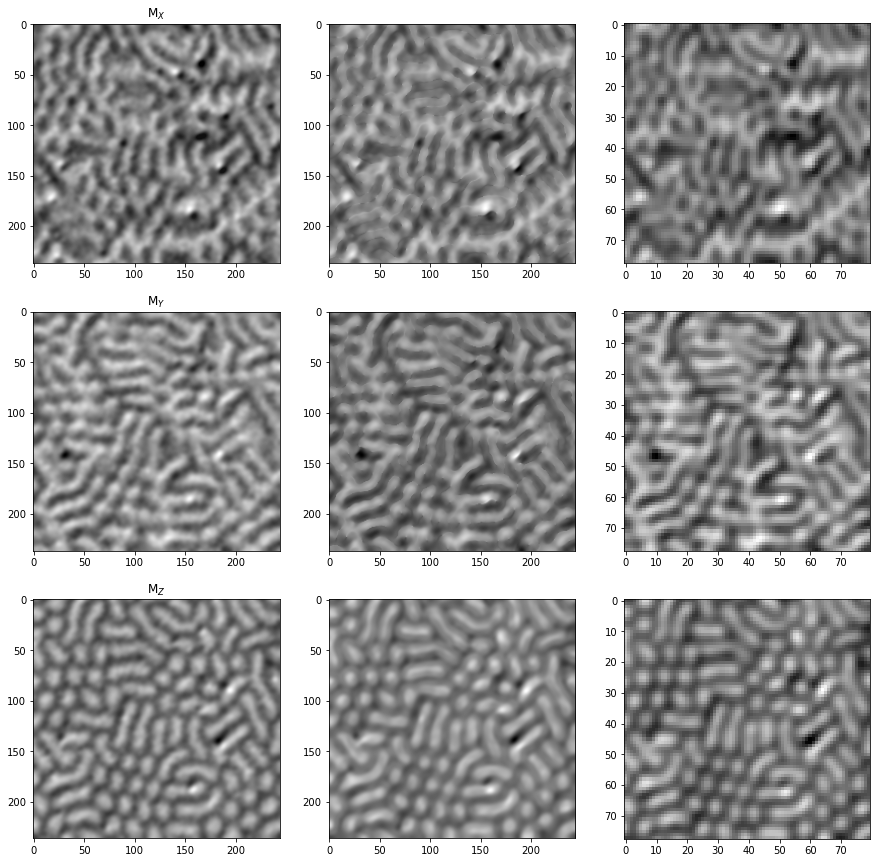

In [133]:
plt.figure(figsize=(15, 15));
plt.subplot(331);
plt.imshow(m_1_adjusted, cmap='gray');
plt.title(fr'M$_{axis_1}$');
plt.subplot(332);
plt.imshow(U, cmap='gray');
plt.subplot(333);
plt.imshow(U_g, cmap='gray');
plt.subplot(334);
plt.imshow(m_2_adjusted, cmap='gray');
plt.title(fr'M$_{axis_2}$');
plt.subplot(335);
plt.imshow(V, cmap = 'gray');
plt.subplot(336);
plt.imshow(V_g, cmap='gray');
plt.subplot(337);
plt.imshow(m_3_adjusted, cmap='gray');
plt.title(fr'M$_{axis_3}$');
plt.subplot(338);
plt.imshow(W, cmap='gray');
plt.subplot(339);
plt.imshow(W_g, cmap='gray');


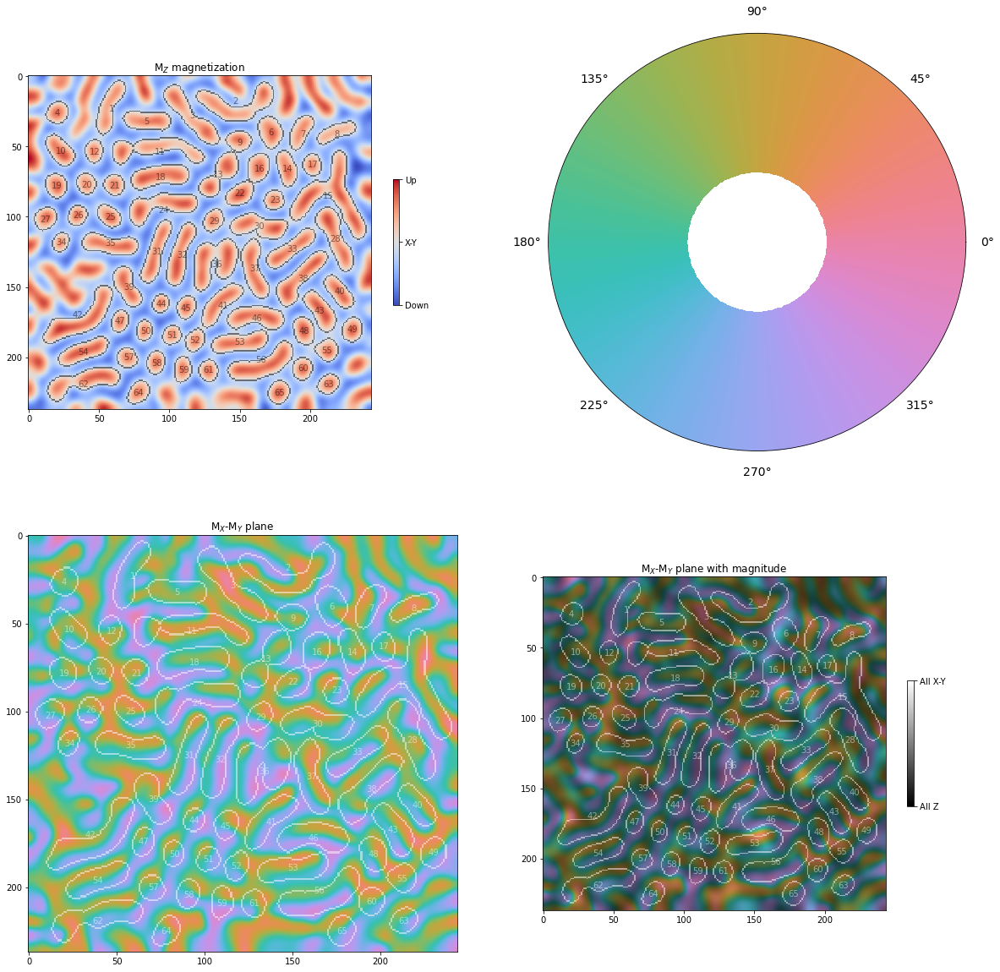

In [15]:
fig = plt.figure(figsize=(20, 20));

ax1 = fig.add_subplot(221);
ax1.imshow(thetas_flattened, cmap=cm.coolwarm_r);

show_all_circles(thetas_flattened, contours_g, ax1, alpha=0.5);

sm = cm.ScalarMappable(cmap=cm.coolwarm)
cbar = fig.colorbar(sm, ax=ax1, shrink=0.3);
cbar.set_ticks([0, 0.5, 1]);
cbar.ax.set_yticklabels(['Down', f'{axis_1}-{axis_2}', 'Up']);
#cbar.set_label('Magnetization in Z');
ax1.set_title(rf'M$_{axis_3}$ magnetization');# ax1.imshow(masked_circles, interpolation='none');

ax2 = fig.add_subplot(222, polar=True);
show_phase_colors_circle(ax2, add_dark_background=False, text_color='black');

ax3 = fig.add_subplot(223);
ax3.imshow(phis_flattened, cmap=ciecam02_cmap());
show_all_circles(thetas_flattened, contours_g, ax3, alpha=0.5, color='white');

ax3.set_title(rf'M$_{axis_1}$-M$_{axis_2}$ plane');

ax4 = fig.add_subplot(224);
phis_flattened_rgba = render_phases_and_magnitudes(phis_flattened, magnitudes_2d_flattened)
ax4.imshow(phis_flattened_rgba, cmap=ciecam02_cmap());
show_all_circles(thetas_flattened, contours_g, ax4, alpha=0.5, color='white');

sm = cm.ScalarMappable(cmap=cm.binary_r)
cbar = fig.colorbar(sm, ax=ax4, shrink=0.3);
cbar.set_ticks([0, 1]);
cbar.ax.set_yticklabels([f'All {axis_3}', f'All {axis_1}-{axis_2}']);

ax4.set_title(rf'M$_{axis_1}$-M$_{axis_2}$ plane with magnitude');


Of 30 circular features total, 21, namely [25, 31, 32, 33, 34, 35, 39, 40, 41, 42, 44, 45, 47, 49, 50, 53, 54, 57, 60, 63, 65], have deviations ≤ pi/6 (0.52)
Index [33] is the best match


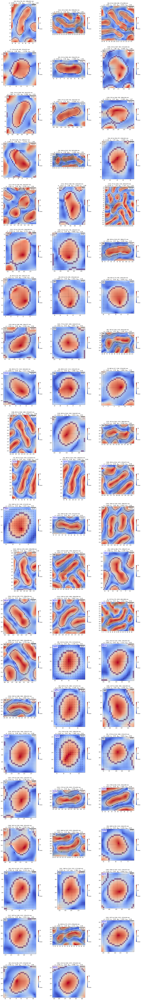

In [18]:
candidates, all_contours = show_circles(magnitudes_flattened, phis, thetas, contours_g, scale,
                                        phis_m=phis_flattened_rgba, normalize=False, show_numbers=True, show_axes=True, show_title=True)

indices = list(candidates.keys())
print(f'Of {len(circular_contours)} circular features total, {len(indices)}, namely {indices}, have deviations ≤ pi/6 ({np.pi / 6:.2f})')

if len(indices) > 0:
    values = np.array(list(candidates.values()))
    best_std = np.min(values[:, 1])
    best_index = [index for index, details in candidates.items()
                  if details[1] == best_std]
    print(f'Index {best_index} is the best match')


In [18]:
print(candidates.keys(), all_contours.keys())

dict_keys([26, 31, 32, 33, 34, 35, 39, 40, 41, 42, 44, 45, 47, 49, 50, 53, 54, 57, 60, 63, 65]) dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65])


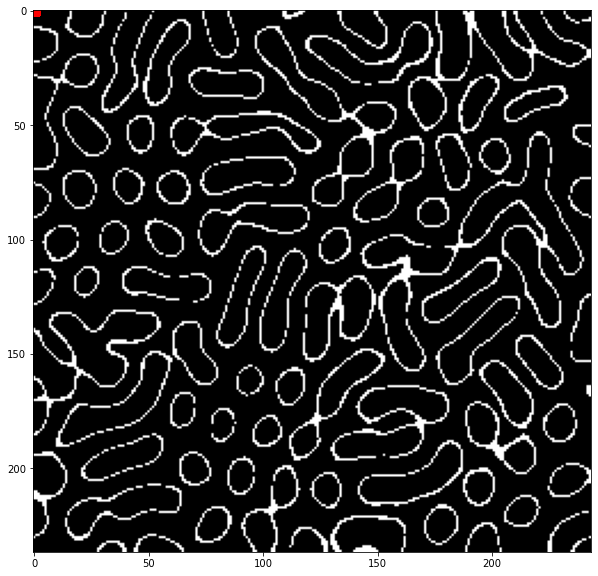

In [19]:
po2 = np.pi / 2
threshold = 0.02
img = m_3_adjusted

plt.figure(figsize=(10, 10));
plt.imshow(np.logical_and(0.92 * po2 <= thetas_flattened, thetas_flattened <= 1.08 * po2), cmap='gray');
plt.scatter(np.logical_and(-threshold <= img[1], img[1] <= threshold), np.logical_and(-threshold <= img[0], img[0] <= threshold), c='r');

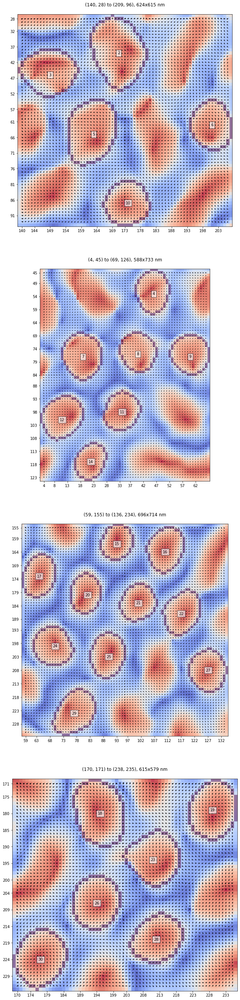

In [20]:
show_groups(circular_contours, magnitudes, phis, thetas, scale)

In [21]:
# ltem_data_name = 'img005_alpha05.npy'
# ltem_data_name = 'img006_alpha05_OL0000.npy'
# ltem_data_name = '00_B.npy'
ltem_data_name = 'n50_B.npy'
ltem_data_path = indir + 'will/' + ltem_data_name

ltem_phases, ltem_magnitudes, ltem_circular_contours, ltem_contours_g, ltem_alphas = process_ltem_data(ltem_data_path)
# Rotate phase data by 90º, staying within 0..2 pi
ltem_phases = np.where(ltem_phases >= 3/2 * np.pi, ltem_phases - 3/2 * np.pi, ltem_phases + np.pi / 2)
print(rf'$\sigma$ for ltem_alpha = {np.std(ltem_alphas[:, 2])}')


$\sigma$ for ltem_alpha = 0.26402268736401724


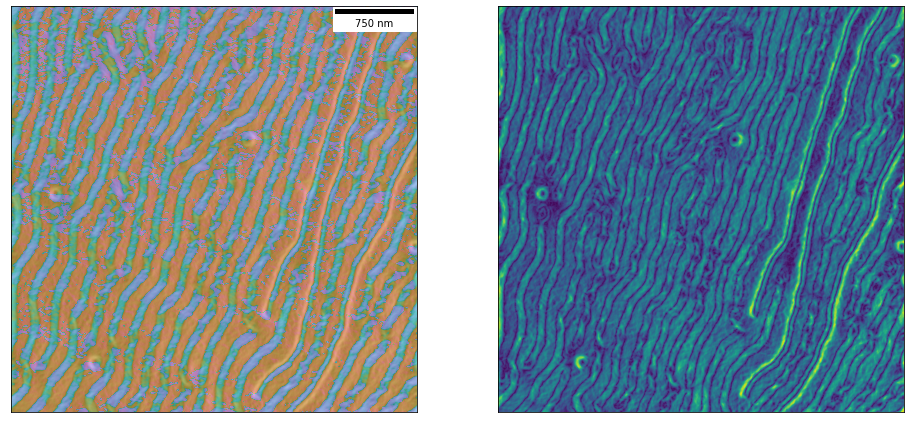

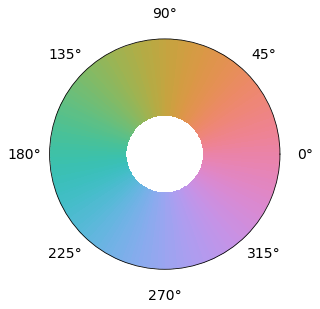

In [22]:
cutoff = 50

plt.figure(figsize=(16, 8))
ax1 = plt.subplot(121)
ax1.imshow(ltem_phases[cutoff:-cutoff, cutoff:-cutoff],
           cmap=ciecam02_cmap())
ax1.imshow(ltem_magnitudes[cutoff:-cutoff, cutoff:-cutoff], cmap=cm.binary_r, alpha=0.25)
#ax1.set_title(f'Phases for {ltem_data_name}');
ax1.set_xticks([])
ax1.set_yticks([])
ax1.add_artist(ScaleBar(1.987e-9))
ax2 = plt.subplot(122)
#ax2.imshow(ltem_circular_contours)
ax2.imshow(ltem_magnitudes[cutoff:-cutoff, cutoff:-cutoff])
#show_all_circles(ltem_magnitudes[cutoff:-cutoff, cutoff:-cutoff],
#                 ltem_circular_contours, ax2, alpha=0.5, show_numbers=False)
#ax2.set_title(f'Magnitudes for {ltem_data_name}');
ax2.set_xticks([])
ax2.set_yticks([])
show_phase_colors_circle(add_dark_background=False)


/opt/homebrew/Caskroom/miniforge/base/envs/pynv/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


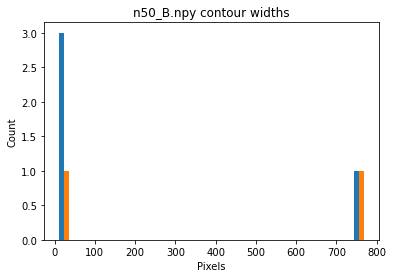

In [23]:
ltem_boxes = get_bounding_boxes(ltem_contours_g)
ltem_box_widths = np.asarray(ltem_boxes)[:, 2]

plt.hist(ltem_box_widths, bins=25);
plt.xlabel('Pixels');
plt.ylabel('Count');
plt.title(f'{ltem_data_name} contour widths');

0.8202975089226998 1.0634576515342942 0.8202975089226998
[2.61699488 2.67995489 2.45562574 2.76956434 2.98323427 2.54458861
 2.46198233 2.76556895 2.68824985 2.55891309 2.63921656 2.67816019
 2.67300945 2.48911266 2.76795415 2.46091454 2.60034185 2.69999256
 2.79939358 2.50080202 2.6352813  2.40021606 2.61314431 2.79123211
 2.52878002 2.67918557 2.56537074 2.74848462 2.555583  ]


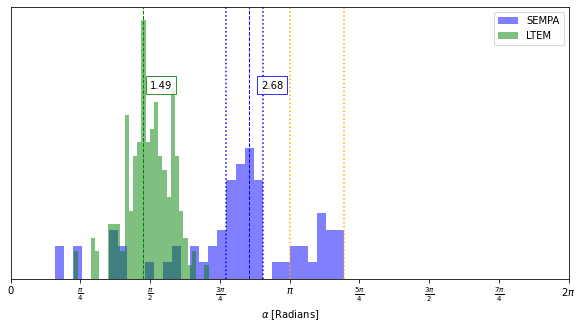

In [24]:
p, all_alphas, circle_alphas = show_alphas(contours_g, circular_contours, phis, f'{name} {str(runs)} and {ltem_data_name}', show_circles_separately=False, bins=32, ltem_data=ltem_alphas[:, 2], show_title=False)

low_indices = np.where(np.logical_and(
    all_alphas[:, 2] < 0.95 * np.pi, all_alphas[:, 2] > 0.75 * np.pi))
high_indices = np.where(all_alphas[:, 2] > 0.9 * np.pi)

low_hump = all_alphas[low_indices][:, 3]
high_hump = all_alphas[high_indices][:, 3]

sigma_low = np.mean(low_hump)
sigma_high = np.mean(high_hump)

p.axvline(2.68 - 0.26, color='blue', linestyle='dotted');
p.axvline(2.68 + 0.16, color='blue', linestyle='dotted')
p.axvline(3.5 - 0.35, color='orange', linestyle='dotted')
p.axvline(3.5 + 0.25, color='orange', linestyle='dotted')

print(sigma_low, sigma_high, np.mean(low_hump))
print(all_alphas[low_indices][:, 2])


In [29]:
all_alphas[:, 2].max()

3.7531790053160536

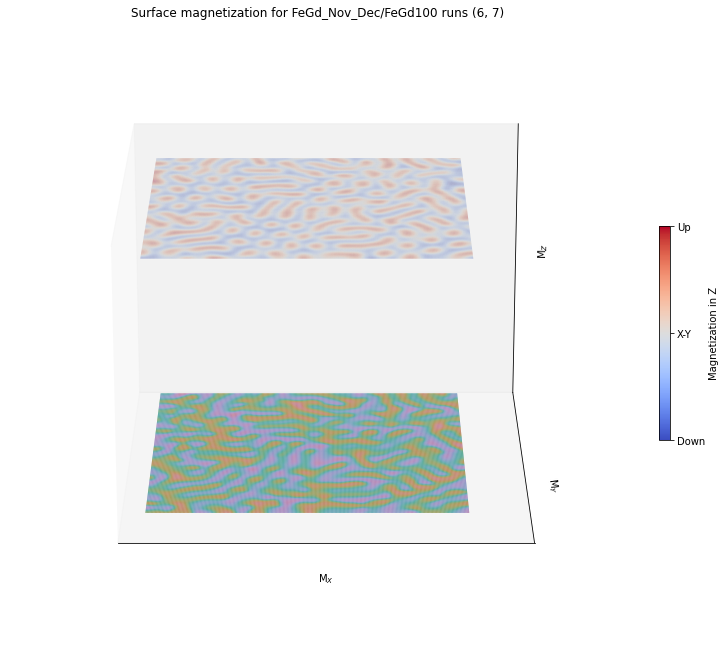

In [88]:
# %matplotlib inline
# %matplotlib widget
# mpl.use('MacOSX')

# azim and elev have units of degrees
azim, elev, dist = -90, 20, 20;
scale_factor = 0.008;

x_img, y_img, z_img = m_1_adjusted, m_2_adjusted, m_3_adjusted

# Set things up for the scale of the calculated magnitudes
xlim = np.abs(x_img).max() * 1.1
ylim = np.abs(y_img).max() * 1.1
zlim = np.abs(z_img).max() * 1.1

# xs, ys = rescale_to(x, Us_g), rescale_to(y, Vs_g)
xs, ys = rescale_to(X, x_img), rescale_to(Y, y_img)

lengths = get_magnitudes(x_img, y_img, z_img)

fig = plt.figure(figsize=(10, 10), constrained_layout=True);
ax = fig.add_subplot(111, projection='3d');

# Plot the x-y phase map at z=-1, z phases at z=1. Meshgrid for x and y, array of z=0, use
# phis and thetas as the facecolors of the surface plots
# x_range, y_range = np.linspace(Us_g.min(), Us_g.max(), xd), np.linspace(Vs_g.min(), Vs_g.max(), yd)
x_range, y_range = np.linspace(x_img.min(), x_img.max(), xd), \
                   np.linspace(y_img.min(), y_img.max(), yd)

surf_x, surf_y = np.meshgrid(x_range, y_range)
surf_z = np.zeros_like(phis_flattened)

cmap_phi = ciecam02_cmap()(np.flipud(phis_flattened) / (2 * np.pi))
cmap_theta = cm.coolwarm_r(np.flipud(thetas_flattened) / np.pi)

ax.plot_surface(surf_x, surf_y, surf_z - 0.9 * zlim, alpha=1, linewidth=0,
                antialiased=True, facecolors=cmap_phi, rcount=yd, ccount=xd);
    
ax.plot_surface(surf_x, surf_y, surf_z + 0.9 * zlim, alpha=0.4, linewidth=0,
                antialiased=True, facecolors=cmap_theta, rcount=yd, ccount=xd);

# for x1, y1, z1, u1, v1, w1, l in zip(xs, ys, Z, U_g, V_g, W_g, lengths):
#     ax.quiver(x1, -y1, z1, u1, v1, w1, length=scale_factor, arrow_length_ratio=0.35, pivot='tail', lw=3,
#               color=cm.coolwarm((w1 - np.min(W_g)) / (np.max(W_g) - np.min(W_g))));

ax.set_xlabel(fr'M$_{axis_1}$');
ax.set_ylabel(fr'M$_{axis_2}$');
ax.set_zlabel(fr'M$_{axis_3}$');

ax.set_xlim3d((-xlim, xlim));
ax.set_ylim3d((-ylim, ylim));
ax.set_zlim3d((-zlim, zlim));

ax.grid(False);
ax.set_xticks([]);
ax.set_yticks([]);
ax.set_zticks([]);
# ax.auto_scale_xyz([-xlim, xlim], [-ylim, ylim], [-zlim, zlim]);
ax.autoscale_view(tight=True);

ax.set_title(f'Surface magnetization for {name} runs {runs}');

ax.azim = azim;
ax.elev = elev;
# ax.dist = dist;

# norm = Normalize()

# norm.autoscale(Ws_g)
sm = cm.ScalarMappable(cmap=cm.coolwarm)
sm.set_array([])

cbar = fig.colorbar(sm, ax=ax, shrink=0.3);

cbar.set_ticks([0, 0.5, 1]);
cbar.ax.set_yticklabels(['Down', f'{axis_1}-{axis_2}', 'Up']);
cbar.set_label(f'Magnetization in {axis_3}');

# Apply offsets

In [ ]:
# Apply offsets

m_1_denoised, m_2_denoised = m_1_fitted_denoised - m_1_offset, m_2_fitted_denoised - m_2_offset

print('M{} denoised - min: {:.2f}, max: {:.2f}, average: {:.2f}, PtP: {:.2f}'.format(
    axis_1, m_1_denoised.min(), m_1_denoised.max(), np.average(m_1_denoised), np.ptp(m_1_denoised)))
print('M{} denoised - min: {:.2f}, max: {:.2f}, average: {:.2f}, PtP: {:.2f}'.format(
    axis_2, m_2_denoised.min(), m_2_denoised.max(), np.average(m_2_denoised), np.ptp(m_2_denoised)))

# Remove gradients

Imperfections in the imaging components might leave undesirable gradient artifacts in the image.

## Remove line errors

In [ ]:
m_1_delined, m_2_delined = remove_line_errors(m_1, 20), remove_line_errors(m_2, 20)
m_1_delined, m_2_delined = rescale_to(m_1_delined, m_1), rescale_to(m_2_delined, m_2)

In [ ]:
plt.figure(figsize=(20, 20));
plt.subplot(2, 2, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{}'.format(axis_1));
plt.subplot(2, 2, 2);
plt.imshow(m_2, cmap='gray');
plt.title('M{}'.format(axis_2));
plt.subplot(2, 2, 3);
plt.imshow(m_1_delined, cmap='gray');
plt.title('M{} with line errors removed'.format(axis_1));
plt.subplot(2, 2, 4);
plt.imshow(m_2_delined, cmap='gray');
plt.title('M{} with line errors removed'.format(axis_2));

## Mean shift

This is used to improve image segmentation

In [ ]:
# m_1_shift, m_2_shift = mean_shift_filter(m_1_delined), mean_shift_filter(m_2_delined)
m_1_shift, m_2_shift = mean_shift_filter(m_1), mean_shift_filter(m_2)
m_4_shift, m_3_shift = mean_shift_filter(m_4), mean_shift_filter(m_3)

In [ ]:
plt.figure(figsize=(20, 20));
plt.subplot(2, 2, 1);
plt.imshow(m_1_shift, cmap='gray');
plt.title('M{}'.format(axis_1));

plt.subplot(2, 2, 2);
plt.imshow(m_2_shift, cmap='gray');
plt.title('M{}'.format(axis_2));

plt.subplot(2, 2, 3);
plt.imshow(m_4_shift, cmap='gray');
plt.title('M{}'.format(axis_4));

plt.subplot(2, 2, 4);
plt.imshow(m_3_shift, cmap='gray');
plt.title('M{}'.format(axis_3));

## Segment

Find the features in the images

In [ ]:
m_1_thresh, m_1_seg, m_1_masks = segment_image(m_1_shift, segments=segments)
m_2_thresh, m_2_seg, m_2_masks = segment_image(m_2_shift, segments=segments)
m_3_thresh, m_3_seg, m_3_masks = segment_image(m_3_shift, segments=segments)
m_4_thresh, m_4_seg, m_4_masks = segment_image(m_4_shift, segments=segments)

In [ ]:
plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_1_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_1_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_1_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_1_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_1 * m_1_masks[0, 0], vmin=m_1_min, vmax=m_1_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_1 * m_1_masks[0, 1], vmin=m_1_min, vmax=m_1_max, cmap='gray');
plt.title('Area 2 masked');

plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_2_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_2_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_2_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_2_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_2 * m_2_masks[0, 0], vmin=m_2_min, vmax=m_2_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_2 * m_2_masks[0, 1], vmin=m_2_min, vmax=m_2_max, cmap='gray');
plt.title('Area 2 masked');

plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_3_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_3_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_3_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_3_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_3 * m_3_masks[0, 0], vmin=m_3_min, vmax=m_3_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_3 * m_3_masks[0, 1], vmin=m_3_min, vmax=m_3_max, cmap='gray');
plt.title('Area 2 masked');

plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_4_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_4_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_4_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_4_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_4 * m_4_masks[0, 0], vmin=m_4_min, vmax=m_4_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_4 * m_4_masks[0, 1], vmin=m_4_min, vmax=m_4_max, cmap='gray');
plt.title('Area 2 masked');

## Fit images

Find a polynomial fit for the images and remove the background gradient

In [ ]:
# m_1 first
m_1_light_mask, m_1_dark_mask = m_1_masks[0, 0], m_1_masks[0, 1]

m_1_light_fit_all, m_1_light_fit = fit_image(m_1, m_1_light_mask)
m_1_dark_fit_all, m_1_dark_fit = fit_image(m_1, m_1_dark_mask)

m_1_light_fitted, m_1_dark_fitted = m_1 - m_1_light_fit_all, m_1 - m_1_dark_fit_all

# and m_2
m_2_light_mask, m_2_dark_mask = m_2_masks[0, 0], m_2_masks[0, 1]

m_2_light_fit_all, m_2_light_fit = fit_image(m_2, m_2_light_mask)
m_2_dark_fit_all, m_2_dark_fit = fit_image(m_2, m_2_dark_mask)

m_2_light_fitted, m_2_dark_fitted = m_2 - m_2_light_fit_all, m_2 - m_2_dark_fit_all


# Rescale both
m_1_light_fitted, m_2_light_fitted = rescale_to(m_1_light_fitted, m_1), rescale_to(m_2_light_fitted, m_2)

In [ ]:
plt.figure(figsize=(30, 20));

plt.subplot(2, 3, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{} original'.format(axis_1));
plt.subplot(2, 3, 2);
plt.imshow(m_1_light_fit_all, cmap='gray');
plt.title('1st fit');
plt.subplot(2, 3, 3);
plt.imshow(m_1_dark_fit_all, cmap='gray');
plt.title('2nd fit');
plt.subplot(2, 3, 5);
plt.imshow(m_1_light_fitted, cmap='gray');
plt.title('Subtracted 1st fit');
plt.subplot(2, 3, 6);
plt.imshow(m_1 - m_1_dark_fit_all, cmap='gray');
plt.title('Subtracted 2nd fit');

plt.figure(figsize=(30, 20));
plt.subplot(2, 3, 1);
plt.imshow(m_2, cmap='gray');
plt.title('M{} original'.format(axis_2));
plt.subplot(2, 3, 2);
plt.imshow(m_2_light_fit_all, cmap='gray');
plt.title('1st fit');
plt.subplot(2, 3, 3);
plt.imshow(m_2_dark_fit_all, cmap='gray');
plt.title('2nd fit');
plt.subplot(2, 3, 5);
plt.imshow(m_2_light_fitted, cmap='gray');
plt.title('Subtracted 1st fit');
plt.subplot(2, 3, 6);
plt.imshow(m_2 - m_2_dark_fit_all, cmap='gray');
plt.title('Subtracted 2nd fit');

# Remove noise

In [ ]:
m_1_fitted_denoised, m_1_fitted_denoised_blurred = clean_image(m_1_light_fitted, sigma=sigma, h=h)
m_2_fitted_denoised, m_2_fitted_denoised_blurred = clean_image(m_2_light_fitted, sigma=sigma, h=h)

In [ ]:
plt.figure(figsize=(20, 10));

plt.subplot(1, 2, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{} original'.format(axis_1));
plt.subplot(1, 2, 2);
plt.imshow(m_1_fitted_denoised, cmap='gray');
plt.title('Denoised fit for M{}'.format(axis_1));

plt.figure(figsize=(20, 10));

plt.subplot(1, 2, 1);
plt.imshow(m_2, cmap='gray');
plt.title('M{} original'.format(axis_2));
plt.subplot(1, 2, 2);
plt.imshow(m_2_fitted_denoised, cmap='gray');
plt.title('Denoised fit for M{}'.format(axis_2));

In [ ]:
# Extract phase and magnitude information

phases = get_phases(m_1_denoised, m_2_denoised)
magnitudes = get_magnitudes(m_1_denoised, m_2_denoised)
magnitudes /= magnitudes.max()
print('Phase spectrum for run {}: {:.6f} - {:.6f} ({:.3f}º - {:.3f}º)'.format(
    run, phases.min(), phases.max(), phases.min() * 180 / np.pi, phases.max() * 180 / np.pi))

# Display results

In [ ]:
# Show a colorized version of the domains

img = render_phases_and_magnitudes(magnitudes, phases)

In [ ]:
np.min(img), np.max(img), np.min(phases), np.max(phases), np.min(magnitudes), np.max(magnitudes)

In [ ]:
display_results(img, m_1_denoised, m_1_light_fitted - m_1_offset, m_2_denoised, m_2_light_fitted - m_2_offset, intensity_1_flat, scale, full_name, arrow_scale=arrow_scale * 4, arrow_color=arrow_color, axis_1=axis_1, axis_2=axis_2)

In [ ]:
save_file(file, intensity_flat, img, axis_1, axis_2, scale, img_denoised_1=m_1_denoised,
          img_denoised_2=m_2_denoised, arrow_color=arrow_color, arrow_scale=arrow_scale)